---
#  Clase 06: Aprendizaje no supervisado como herramienta exploratoria.
---
### Objetivos de la notebook:

- [x] Aplicar algoritmos de aprendizaje no supervisado a nuestras imágenes.
- [x] Analizar el comportamiento espectral de las clases generadas.
- [X] Guardar los mapas resultantes y analizarlos en QGIS. 

### Datos con los que trabajaremos en esta Notebook:

- Recorte de la escena Sentinel-2 del dique Roggero generada en la Notebook 05: **output/S2_20181006.tif**


Empecemos por importar algunas librerías:

```python
import os

import numpy as np
import matplotlib
import matplotlib.pyplot as plt

import itertools

import rasterio
from rasterio.plot import show

import funciones as fn
```

In [1]:
import os

import numpy as np
import matplotlib
import matplotlib.pyplot as plt

import itertools

import rasterio
from rasterio.plot import show

import funciones as fn

## 1. Abrir la imagen generada anteriormente y prepararla para el _Clustering_

En el contexto de un problema de aprendizaje no supervisado, no contamos con datos etiquetados ni clases previamente establecidas, con lo cual no tendremos un _Y_ (etiquetas), sino solamente un _X_. A este _X_ lo debemos redimensionar como una _tabla_ plana, porque esa estructura esperan los algoritmos que utilizamos:

```python
raster_fn = 'output/S2_20181006.tif'

with rasterio.open(raster_fn) as src:
    img = src.read()
    metadatos = src.meta
    
    
# Guardo los datos espectrales, rompo la estructura espacial.
d, x, y = img.shape
X = img.reshape([d, x*y]).T

print('Dimensiones del dataset X: ', X.shape)
```

In [3]:
raster_fn = 'output/S2_20181006.tif'

with rasterio.open(raster_fn) as src:
    img = src.read()
    metadatos = src.meta
    
    
# Guardo los datos espectrales, rompo la estructura espacial.
d, x, y = img.shape
X = img.reshape([d, x*y]).T

print('Dimensiones del dataset X: ', X.shape)

Dimensiones del dataset X:  (1206819, 6)


Para entender un poco más qué tipo de coberturas hay en esta escena, podemos visualizarla aplicando distintas combinaciones RGB:

```python
imagen_escalada = fn.scale_multiband(img, p=2)

# Color natural
fig, ax = plt.subplots(figsize = (12,8))
ax.imshow(imagen_escalada[[2,1,0]].transpose(1,2,0))
ax.set_title("Recorte extraído sobre el dique Roggero")
plt.show()

# Falso color infrarrojo
fig, ax = plt.subplots(figsize = (12,8))
ax.imshow(imagen_escalada[[3,2,1]].transpose(1,2,0))
ax.set_title("Recorte extraído sobre el dique Roggero")
plt.show()

# Falso color SWIR
fig, ax = plt.subplots(figsize = (12,8))
ax.imshow(imagen_escalada[[5,3,2]].transpose(1,2,0))
ax.set_title("Recorte extraído sobre el dique Roggero")
plt.show()
```

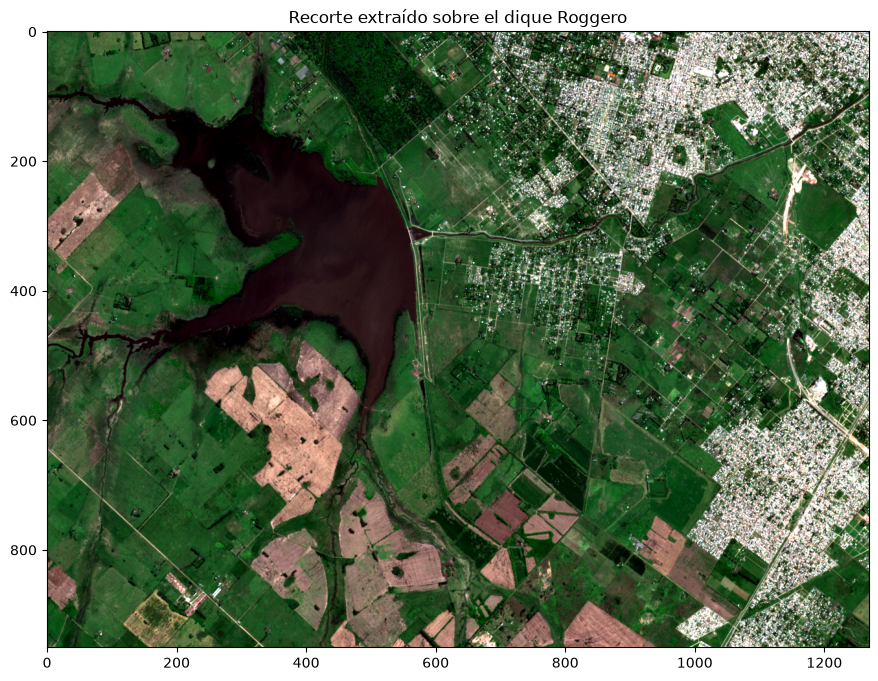

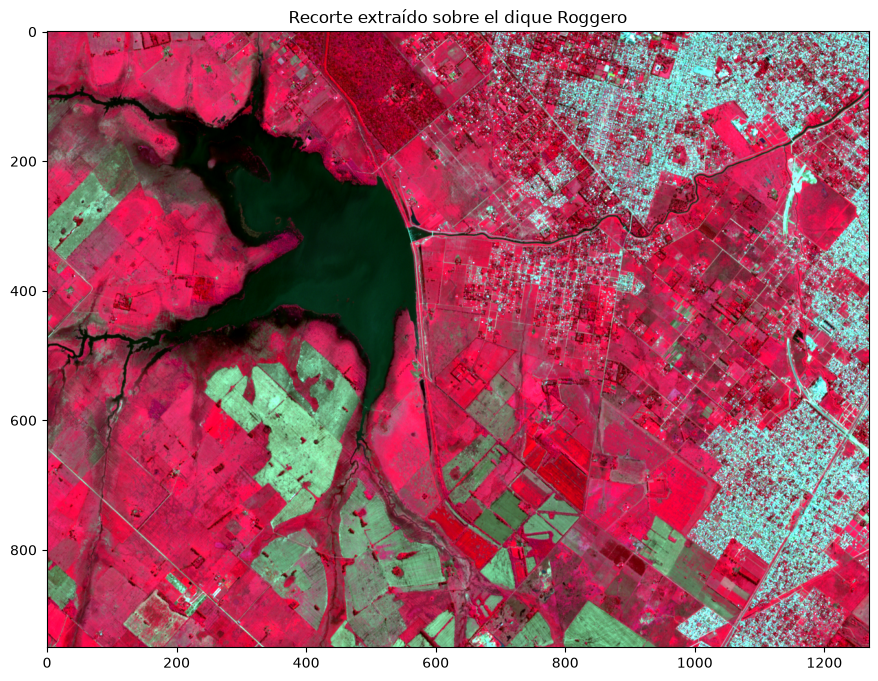

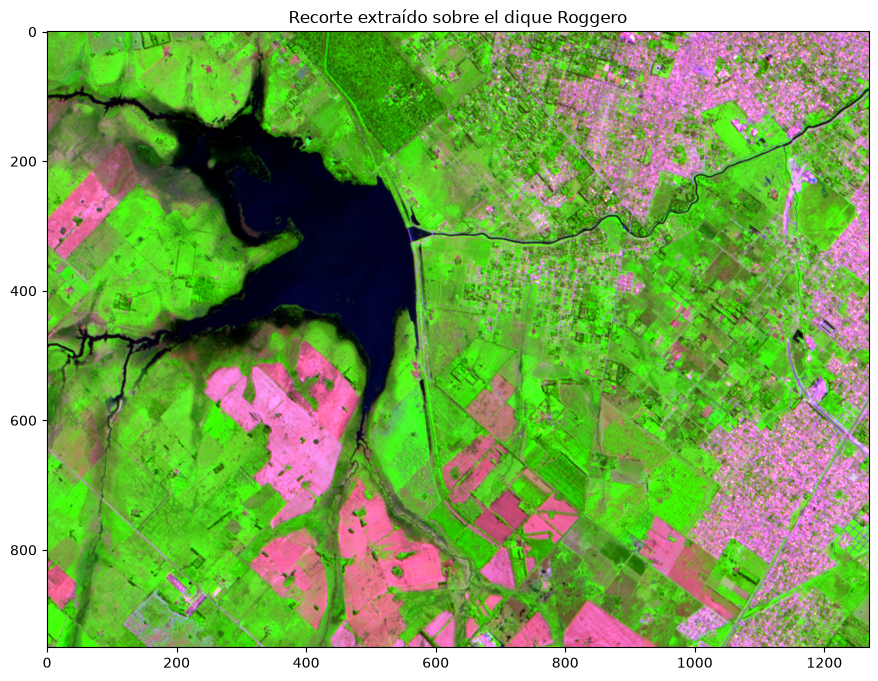

In [4]:
imagen_escalada = fn.scale_multiband(img, p=2)

# Color natural
fig, ax = plt.subplots(figsize = (12,8))
ax.imshow(imagen_escalada[[2,1,0]].transpose(1,2,0))
ax.set_title("Recorte extraído sobre el dique Roggero")
plt.show()

# Falso color infrarrojo
fig, ax = plt.subplots(figsize = (12,8))
ax.imshow(imagen_escalada[[3,2,1]].transpose(1,2,0))
ax.set_title("Recorte extraído sobre el dique Roggero")
plt.show()

# Falso color SWIR
fig, ax = plt.subplots(figsize = (12,8))
ax.imshow(imagen_escalada[[5,3,2]].transpose(1,2,0))
ax.set_title("Recorte extraído sobre el dique Roggero")
plt.show()

### 1.1. Visualizar la distribución de valores de a pares de bandas

Una manera muy útil para entender la distribución de nuestros datos es hacer gráficos de dispersión de a pares de bandas espectrales.  Para ello, la librería `Seaborn` nos simplifica el trabajo usando la herramienta `pairplot`. Hacerlo para todos los píxeles de la imagen puede ser realmente muy demandante para nuestro equipo, con lo cual una estrategia es primero tomar una muestra aleatoria de nuestro _dataset_ X, con el siguiente bloque de código, donde _R_ va a contener los índices de una muestra de 1000 elementos (el tamaño lo definimos como _N_):

```python
import seaborn as sns
import pandas as pd

# Elegimos una serie de índices al azar de tamaño N
N = 1000
R = np.random.randint(low=0, high=X.shape[0], size=N)

bandas = ['B02', 'B03', 'B04', 'B08', 'B11', 'B12']

# Generamos un DataFrame de Pandas con el subcojunto de píxeles
df = pd.DataFrame(X[R], columns=bandas)

# Usamos pairplot para graficar los scatterplots de las bandas
sns.pairplot(df, vars=bandas)
plt.show()
```

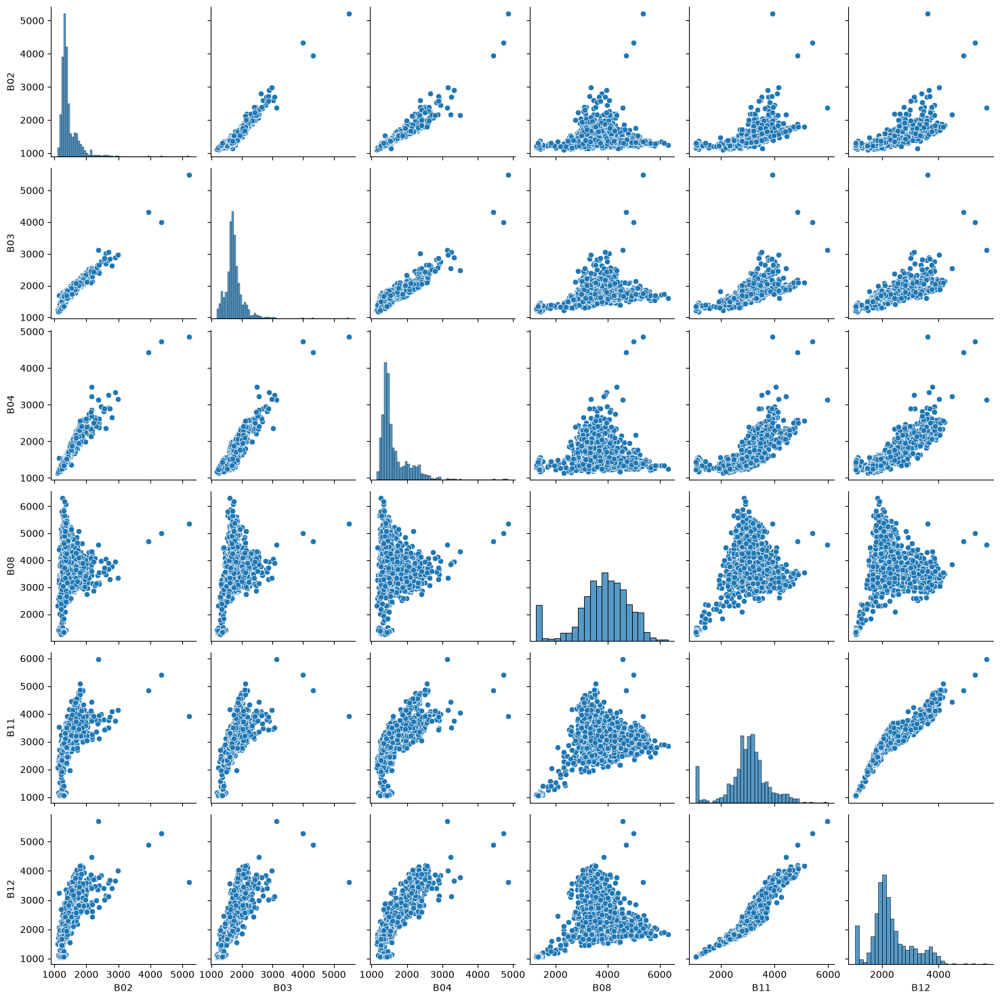

In [6]:
import seaborn as sns
import pandas as pd

# Elegimos una serie de índices al azar de tamaño N
N = 1000
R = np.random.randint(low=0, high=X.shape[0], size=N)

bandas = ['B02', 'B03', 'B04', 'B08', 'B11', 'B12']

# Generamos un DataFrame de Pandas con el subcojunto de píxeles
df = pd.DataFrame(X[R], columns=bandas)

# Usamos pairplot para graficar los scatterplots de las bandas
sns.pairplot(df, vars=bandas)
plt.show()

### 1.2. Correlación entre variables y reducción de la dimensionalidad

El gráfico anterior nos permite ver que hay bandas cuya información está muy correlacionada, y en cierto modo puede ser redundante. Por ejemplo, entre las 3 bandas del visible (B02,B03,B04), o también (aunque no de manera tan _lineal_) entre las dos bandas del SWIR (B11,B12). Para reforzar esta idea podemos calcular la correlación entre nuestras bandas espectrales, usando el método `corr()` de `Pandas`. Lo podemos aplicar sobre el mismo `Dataframe` que usamos para hacer los gráficos de dispersión.

```python
# Calcular la matriz de correlación
corr = df.corr()

print(corr)
```

In [7]:
corr = df.corr()

print(corr)

          B02       B03       B04       B08       B11       B12
B02  1.000000  0.944774  0.939476  0.015235  0.561163  0.712477
B03  0.944774  1.000000  0.888446  0.279969  0.676312  0.738573
B04  0.939476  0.888446  1.000000 -0.080828  0.654228  0.828640
B08  0.015235  0.279969 -0.080828  1.000000  0.423678  0.120456
B11  0.561163  0.676312  0.654228  0.423678  1.000000  0.917525
B12  0.712477  0.738573  0.828640  0.120456  0.917525  1.000000


Para verlo más gráficamente, podemos visualizar la correlación como matriz coloreada, usando la función `heatmap` de Seaborn. Como se trata de una matriz simétrica, podemos _enmascarar_ todo el triángulo superior, para no repetir información. Eso lo podemos hacer ayudándonos de `np.triu`:

```python
# Máscara para ocultar el triángulo superior
mask = np.triu(np.ones_like(corr, dtype=bool))

fig, ax = plt.subplots(figsize=(6, 5))

sns.heatmap(
    corr,
    mask=mask,
    annot=True,
    fmt=".2f",
    cmap="RdBu_r",
    vmin=-1,
    vmax=1,
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8},
    ax=ax
)

ax.set_title("Matriz de correlación entre bandas")

plt.show()
```

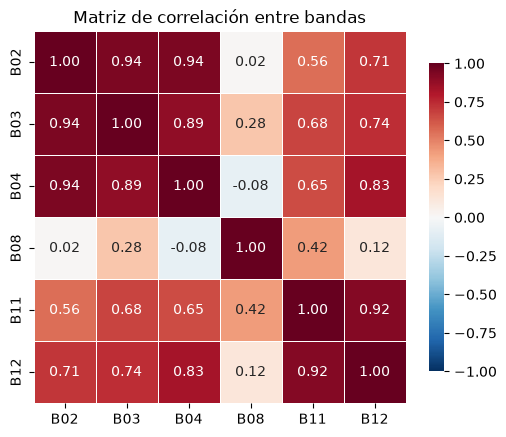

In [34]:
mask = np.triu(np.ones_like(corr, dtype=bool))

fig, ax = plt.subplots(figsize=(6, 5))

sns.heatmap(
    corr,
    mask=False,
    annot=True,
    fmt=".2f",
    cmap="RdBu_r",
    vmin=-1,
    vmax=1,
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8},
    ax=ax
)

ax.set_title("Matriz de correlación entre bandas")

plt.show()

Nosotros venimos trabajando con 6 bandas espectrales, pero a partir del análisis anterior detectamos que podría haber información redundante. Algunas técnicas como el [Análisis de Componentes Principales](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html) nos permitirían resumir la información de la imagen y devolvernos las imágenes con la Componentes que reúnen la mayor variabilidad de los datos. Sin embargo, para mantener la interpretabilidad de los datos seguiremos trabajando con las bandas espectrales, y usaremos esta información para descartar algunas de las bandas en el último ejercicio de esta notebook. 

## 2. Entrenamiento de algoritmos - K-means

En esta sección veremos cómo se aplican los algoritmos de clustering vistos en el teórico sobre nuestros datos. Para ello utilizaremos la librería `scikit-learn`.

**Veremos dos métodos de _clustering_:**
1. El clásico [k-means](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)
1. Una generalización llamada [Gaussian Mixture Models](https://scikit-learn.org/stable/modules/generated/sklearn.mixture.GaussianMixture.html)
En general, casi todos los métodos de _clustering_ se importan de
`sklearn.cluster`. Veamos cómo hacerlo con `KMeans`:

```python
from sklearn.cluster import KMeans
```

In [9]:
from sklearn.cluster import KMeans

### 2.1. Breve descripción del algoritmo iterativo 
1. a cada dato le asigno su centroide más cecano
1. calcular centroides promediando 

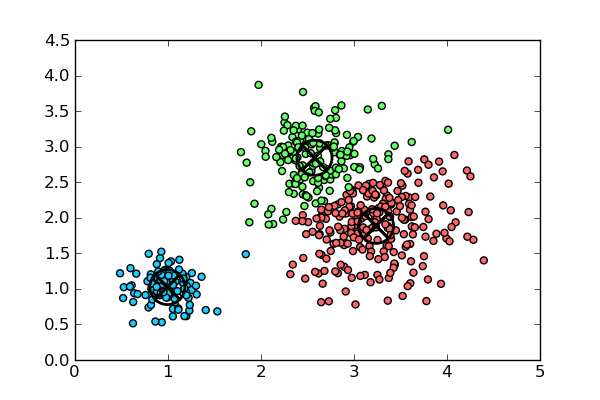

El siguiente [video](https://www.youtube.com/watch?v=5I3Ei69I40s) presenta de forma visual el funcionamiento del algoritmo.

La forma de definir el método de _clustering_ y entrenarlo es similar a la que se usa con los métodos de aprendizaje supervisado:

- Inicializar el objeto (en este caso, lo llamamos `kmeans`) con los hiper-parámetros con el cual queremos que corra. En este caso, uno de los más importantes el el número de _clusters_, `n_clusters`.
- Lo entrenamos con `.fit()`, aplicado sobre todo el conjunto de datos `X`
- El resultado (los datos etiquetados) se guarda en un atributo que tiene el objeto `kmeans` que se llama `labels_`:

```python
# Defino el clustering
kmeans = KMeans(n_clusters=2, random_state=0, n_init=10)

# Lo corro sobre X
kmeans.fit(X)

# Imprimo las etiquetas que puso
kmeans.labels_
```

### 2.2. Pruebas con distintos números de clusters

In [10]:
# Defino el clustering
kmeans = KMeans(n_clusters=2, random_state=0, n_init=10)

# Lo corro sobre X
kmeans.fit(X)

# Imprimo las etiquetas que puso
kmeans.labels_

array([1, 1, 1, ..., 1, 1, 1], shape=(1206819,), dtype=int32)

Si imprimo los valores únicos de estos `labels_`, veré que tengo dos valores, porque yo corrí el KMeans con `n_clusters=2`

```python
print(np.unique(kmeans.labels_))
```

In [11]:
print(np.unique(kmeans.labels_))

[0 1]


También podemos imprimir los centroides de cada uno de los clusters. Cada centroide tiene 6 dimensiones, porque nuestras bandas de entrada fueron 6:
```python
print(kmeans.cluster_centers_)

print('Dimensiones de los centroides: ', kmeans.cluster_centers_.shape)
```

In [12]:
print(kmeans.cluster_centers_)

print('Dimensiones de los centroides: ', kmeans.cluster_centers_.shape)

[[1247.64268651 1359.04941642 1374.28182377 1780.24373004 1431.86211028
  1264.09093046]
 [1486.41121437 1795.91302188 1683.12015703 4083.97693589 3215.44395978
  2460.04344999]]
Dimensiones de los centroides:  (2, 6)


Reordenar este conjunto de datos etiquetados como imagen es muy simple. Con `reshape` y las dimensiones originales de las imágenes (x e y) volvemos a la estructura en 2D:

```python
L = kmeans.labels_
Yimg = L.reshape(x, y)
```

In [13]:
L = kmeans.labels_
Yimg = L.reshape(x, y)

Tener presente que cuando ploteamos estos datos discretos con Matplotlib, por defecto se aplica una rampa de colores continua. Una manera de discretizar los colores es definir explicitamente un mapa de colores con la cantidad de cortes que queremos (uno por cada clase). Eso lo hacemos con una función de Matplotlib que se llama `get_cmap`:

```python
# Ploteamos el resultado
n_clases = kmeans.n_clusters
cmap = plt.get_cmap('viridis', n_clases)

fig, ax = plt.subplots(1,2, figsize=(15, 8), gridspec_kw={'width_ratios': [1.25, 1]})
im = ax[0].imshow(Yimg, cmap=cmap)
cbar = fig.colorbar(im, ax=ax[0])
cbar.set_ticks(range(n_clases))
cbar.set_ticklabels(range(n_clases))
ax[0].set_title("Resultado del clustering")
ax[1].imshow(imagen_escalada[[5,3,2]].transpose(1,2,0))
ax[1].set_title("Imagen RGB")
plt.show()
```

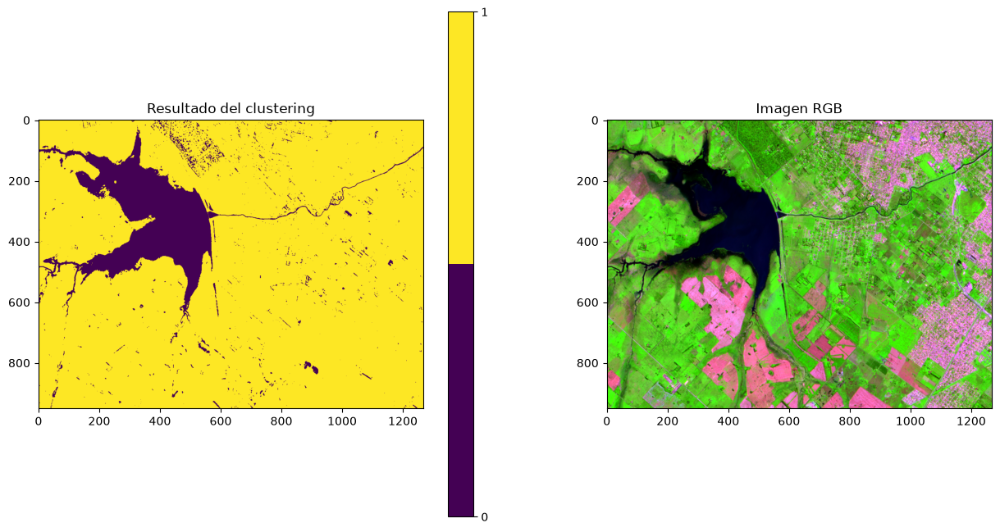

In [14]:
n_clases = kmeans.n_clusters
cmap = plt.get_cmap('viridis', n_clases)

fig, ax = plt.subplots(1,2, figsize=(15, 8), gridspec_kw={'width_ratios': [1.25, 1]})
im = ax[0].imshow(Yimg, cmap=cmap)
cbar = fig.colorbar(im, ax=ax[0])
cbar.set_ticks(range(n_clases))
cbar.set_ticklabels(range(n_clases))
ax[0].set_title("Resultado del clustering")
ax[1].imshow(imagen_escalada[[5,3,2]].transpose(1,2,0))
ax[1].set_title("Imagen RGB")
plt.show()

A continuación, podemos construir los gráficos de dispersión o _scatterplots_ para ver, de a pares de bandas), cómo nos quedaron etiquetados nuestros datos.

Observar abajo cómo usamos el _R_ definido previamente. Si quisieras plotear todos los datos, tendrias que correr el código así:

```python
fig, ax = plt.subplots(figsize=(15, 8))
# Hago el ploteo. Lo hacemos utilizando todos los datos:
# ax.scatter(X[:, 2], X[:, 3], c=L, cmap='Spectral')
# Hago el ploteo de nuestros datos muestreados:
ax.scatter(X[R, 2], X[R, 3], c=L[R], cmap='Spectral')
ax.set_xlabel('RED')
ax.set_ylabel('NIR')
plt.show()
```

Sin embargo, a no ser que estés trabajando con un recorte, no te lo recomendamos

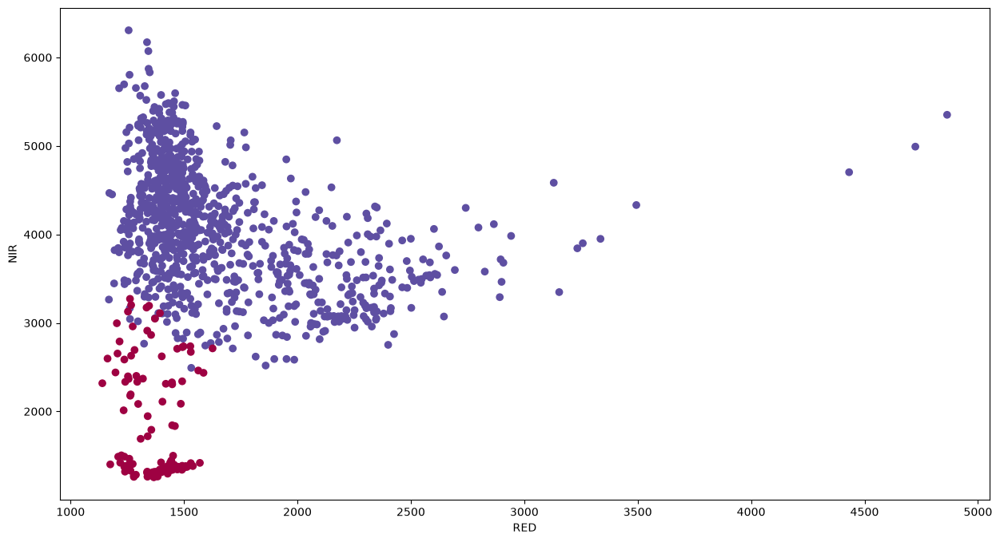

In [15]:
fig, ax = plt.subplots(figsize=(15, 8))
# Hago el ploteo. Lo hacemos utilizando todos los datos:
# ax.scatter(X[:, 2], X[:, 3], c=L, cmap='Spectral')
# Hago el ploteo de nuestros datos muestreados:
ax.scatter(X[R, 2], X[R, 3], c=L[R], cmap='Spectral')
ax.set_xlabel('RED')
ax.set_ylabel('NIR')
plt.show()

Repliquemos ahora el `pairplot` de antes pero ahora con los puntos coloreados por etiqueta:

```python
bandas = ['B02', 'B03', 'B04', 'B08', 'B11', 'B12']

df = pd.DataFrame(X[R], columns=bandas)
df['Cluster'] = L[R]

sns.pairplot(df, vars=bandas, hue='Cluster')
plt.show()
```

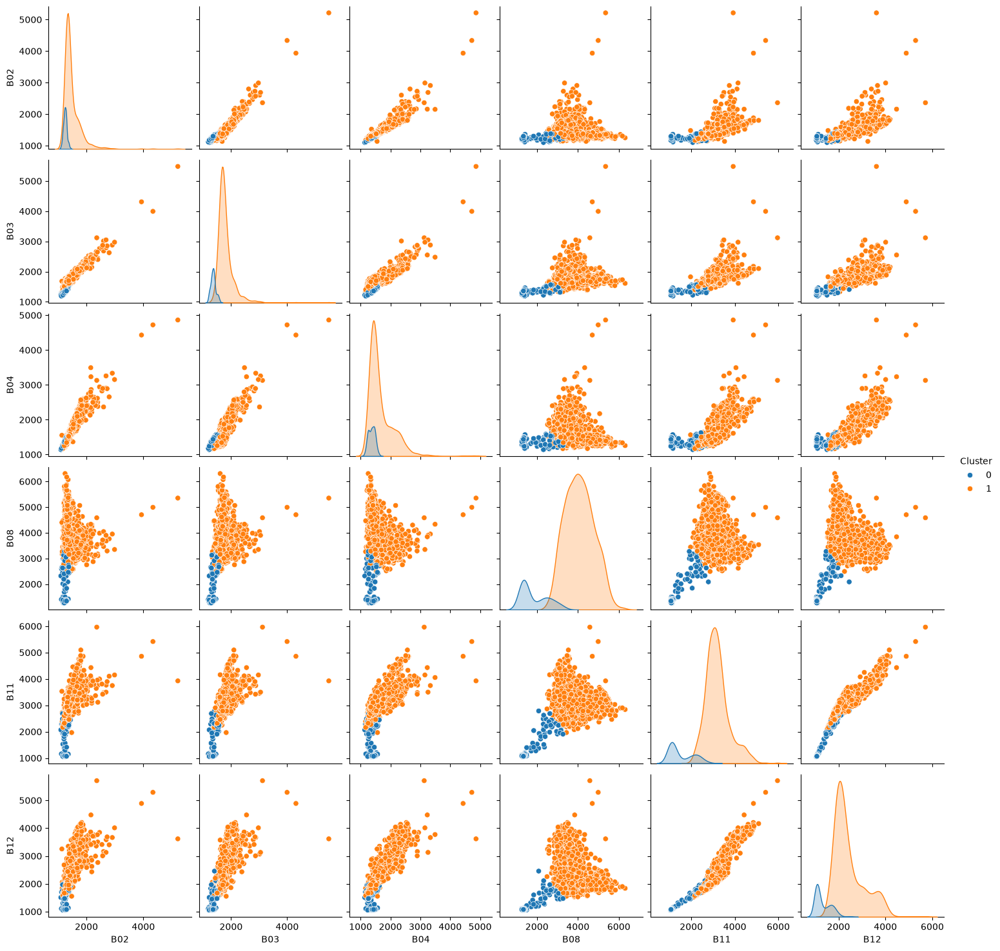

In [16]:
bandas = ['B02', 'B03', 'B04', 'B08', 'B11', 'B12']

df = pd.DataFrame(X[R], columns=bandas)
df['Cluster'] = L[R]

sns.pairplot(df, vars=bandas, hue='Cluster')
plt.show()

Probemos ahora correr el KMeans con 3 clusters, y veamos cómo queda nuestro mapa etiquetado con una salida un poco más elaborada:

```python
# Entrenamos el modelo
kmeans = KMeans(n_clusters=3, random_state=0, n_init=10)
kmeans.fit(X)
L = kmeans.labels_
Yimg = L.reshape([x, y])

# Ploteamos el resultado
n_clases = kmeans.n_clusters
cmap = plt.get_cmap('viridis', n_clases)

fig, ax = plt.subplots(1,2, figsize=(15, 8), gridspec_kw={'width_ratios': [1.25, 1]})
im = ax[0].imshow(Yimg, cmap=cmap)
cbar = fig.colorbar(im, ax=ax[0])
cbar.set_ticks(range(n_clases))
cbar.set_ticklabels(range(n_clases))
ax[0].set_title("Resultado del clustering")
ax[1].imshow(imagen_escalada[[5,3,2]].transpose(1,2,0))
ax[1].set_title("Imagen RGB")
plt.show()
```

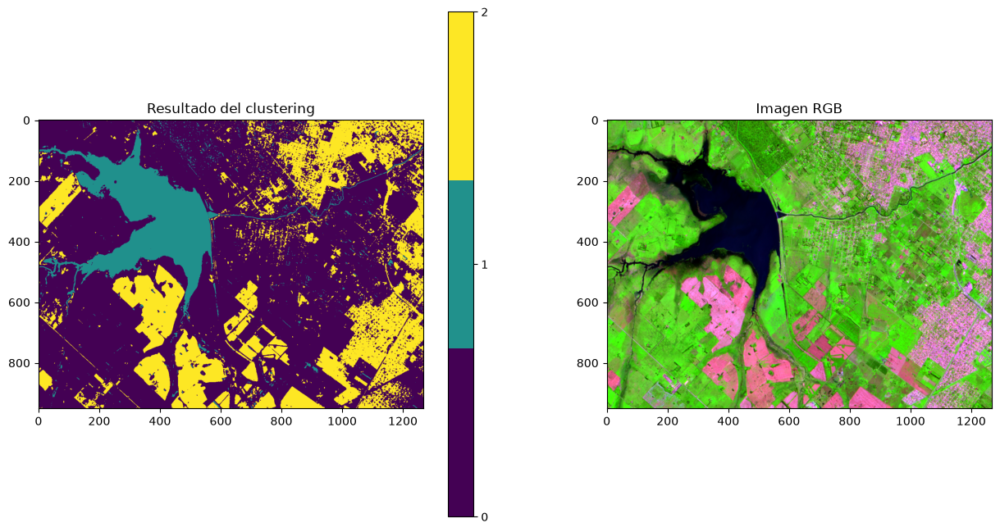

In [17]:
# Entrenamos el modelo
kmeans = KMeans(n_clusters=3, random_state=0, n_init=10)
kmeans.fit(X)
L = kmeans.labels_
Yimg = L.reshape([x, y])

# Ploteamos el resultado
n_clases = kmeans.n_clusters
cmap = plt.get_cmap('viridis', n_clases)

fig, ax = plt.subplots(1,2, figsize=(15, 8), gridspec_kw={'width_ratios': [1.25, 1]})
im = ax[0].imshow(Yimg, cmap=cmap)
cbar = fig.colorbar(im, ax=ax[0])
cbar.set_ticks(range(n_clases))
cbar.set_ticklabels(range(n_clases))
ax[0].set_title("Resultado del clustering")
ax[1].imshow(imagen_escalada[[5,3,2]].transpose(1,2,0))
ax[1].set_title("Imagen RGB")
plt.show()

Vuelvo a repetir el `pairplot`, de nuevo tomando una muestra de datos _R_:

```python
bandas = ['B02', 'B03', 'B04', 'B08', 'B11', 'B12']

df = pd.DataFrame(X[R], columns=bandas)
df['Cluster'] = L[R]

sns.pairplot(df, vars=bandas, hue='Cluster')
plt.show()
```

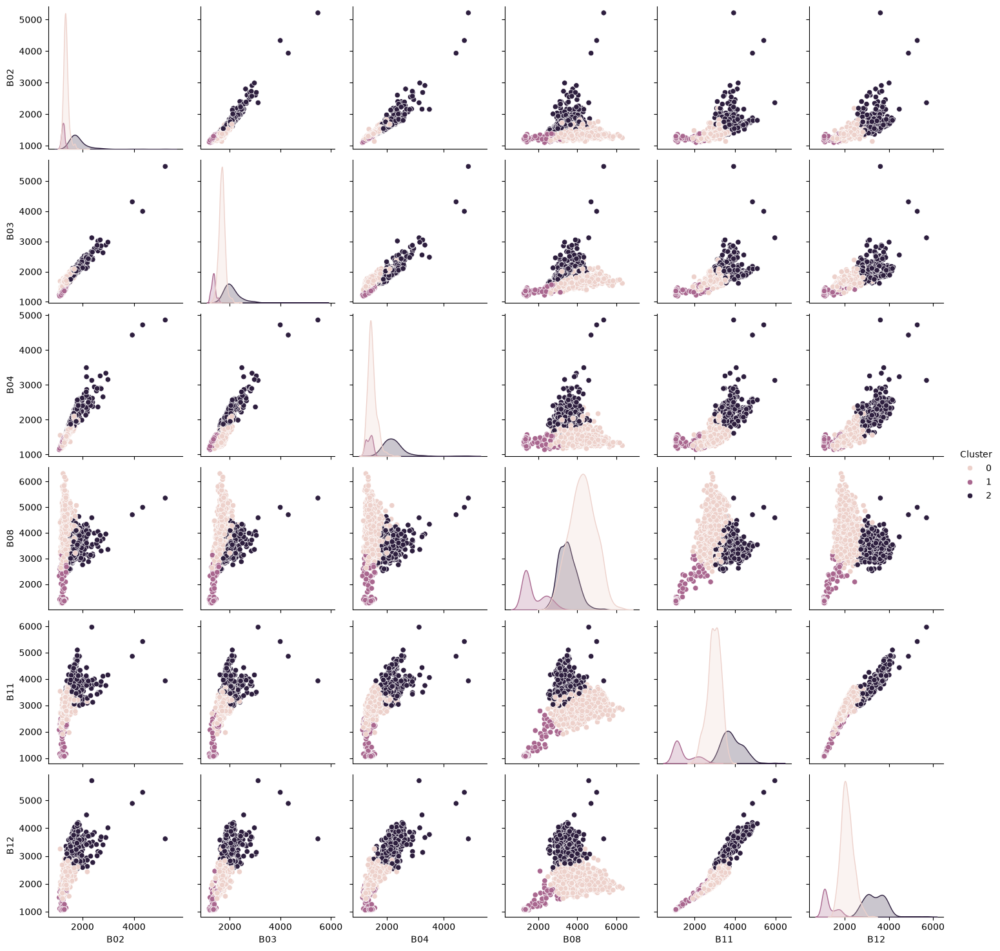

In [18]:
bandas = ['B02', 'B03', 'B04', 'B08', 'B11', 'B12']

df = pd.DataFrame(X[R], columns=bandas)
df['Cluster'] = L[R]

sns.pairplot(df, vars=bandas, hue='Cluster')
plt.show()

Y ahora con 5 _clusters_:

```python
kmeans = KMeans(n_clusters=5, random_state=0, n_init=10)
kmeans.fit(X)
L = kmeans.labels_

Yimg = L.reshape([x, y])

# Ploteamos el resultado
n_clases = kmeans.n_clusters
cmap = plt.get_cmap('viridis', n_clases)

fig, ax = plt.subplots(1,2, figsize=(15, 8), gridspec_kw={'width_ratios': [1.25, 1]})
im = ax[0].imshow(Yimg, cmap=cmap)
cbar = fig.colorbar(im, ax=ax[0])
cbar.set_ticks(range(n_clases))
cbar.set_ticklabels(range(n_clases))
ax[0].set_title("Resultado del clustering")
ax[1].imshow(imagen_escalada[[5,3,2]].transpose(1,2,0))
ax[1].set_title("Imagen RGB")
plt.show()
```

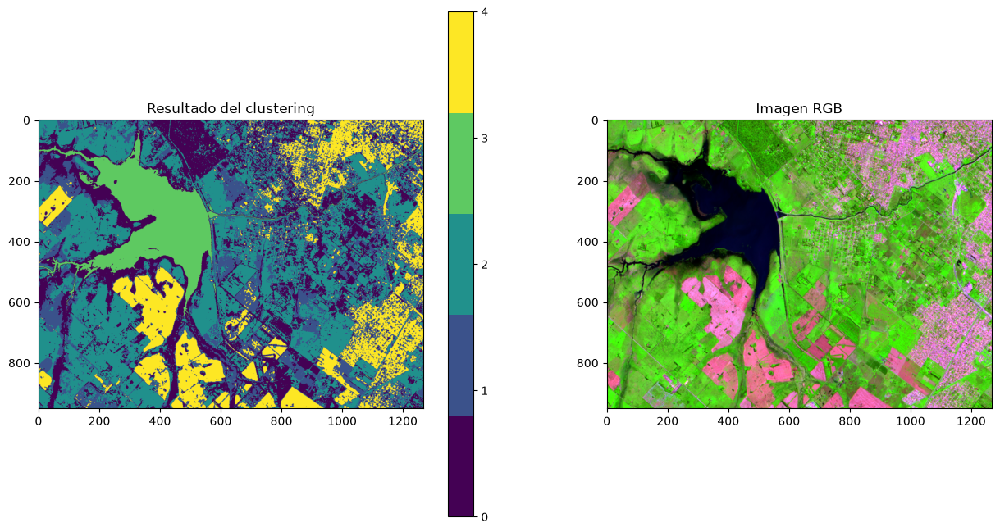

In [19]:
kmeans = KMeans(n_clusters=5, random_state=0, n_init=10)
kmeans.fit(X)
L = kmeans.labels_

Yimg = L.reshape([x, y])

# Ploteamos el resultado
n_clases = kmeans.n_clusters
cmap = plt.get_cmap('viridis', n_clases)

fig, ax = plt.subplots(1,2, figsize=(15, 8), gridspec_kw={'width_ratios': [1.25, 1]})
im = ax[0].imshow(Yimg, cmap=cmap)
cbar = fig.colorbar(im, ax=ax[0])
cbar.set_ticks(range(n_clases))
cbar.set_ticklabels(range(n_clases))
ax[0].set_title("Resultado del clustering")
ax[1].imshow(imagen_escalada[[5,3,2]].transpose(1,2,0))
ax[1].set_title("Imagen RGB")
plt.show()

Y veamos cómo quedar el `pairplot`: 

```python
bandas = ['B02', 'B03', 'B04', 'B08', 'B11', 'B12']

df = pd.DataFrame(X[R], columns=bandas)
df['Cluster'] = L[R]

sns.pairplot(df, vars=bandas, hue='Cluster')
plt.show()
```

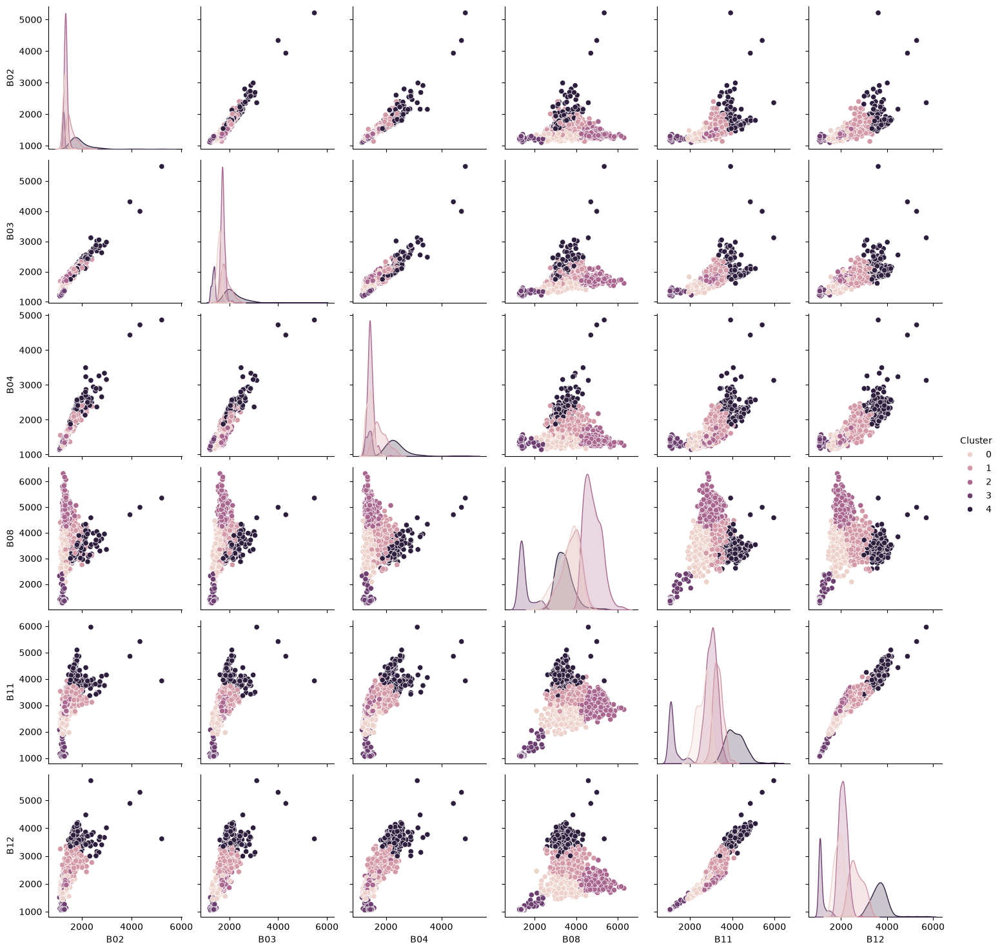

In [20]:
bandas = ['B02', 'B03', 'B04', 'B08', 'B11', 'B12']

df = pd.DataFrame(X[R], columns=bandas)
df['Cluster'] = L[R]

sns.pairplot(df, vars=bandas, hue='Cluster')
plt.show()

Podríamos iniciar a explorar la cantidad de cluster ideales aplicando el método del codo visto anteriormente:
```python
sse = {}
for k in range(1, 10):
    kmeans_ = KMeans(n_clusters=k, random_state=0).fit(X)
    sse[k] = kmeans_.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()
```

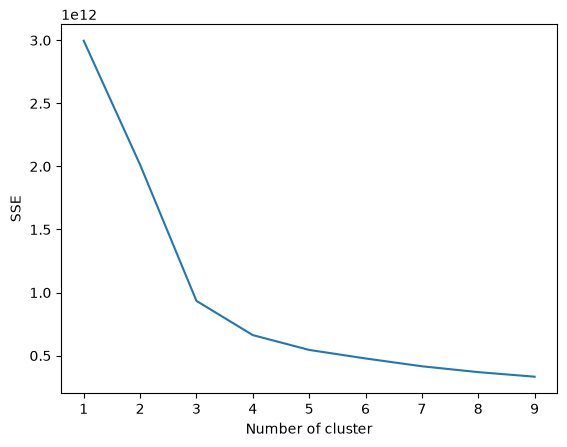

In [21]:
sse = {}
for k in range(1, 10):
    kmeans_ = KMeans(n_clusters=k, random_state=0).fit(X)
    sse[k] = kmeans_.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

Puedes seguir jugando con otra cantidad de K-medias, o con los resultados ya obtenidos cambiar el par de bandas que ploteamos para ver cómo impactó la clasificación sobre nuestros datos.

### 2.3. Guardado del mapa KMeans

Podemos guardar nuestro mapa clasificado como archivo GeoTiff. Para ello podemos tomar como base la variable `metadatos` que leímos junto al GeoTiff, y moodificar algunos parámetros como `count` y ``dtype`. Veamos como hacerlo con el último mapa generado, con 5 clusters:


```python
metadatos_clasif = metadatos.copy()
metadatos_clasif['count'] = 1
metadatos_clasif['dtype'] = 'uint8'

out_fn = f'Clust_IMG_KMeans_{n_clases}.tif'

with rasterio.open(f'output/{out_fn}', 'w', **metadatos_clasif) as dst:
    dst.write(Yimg, 1)
```

In [22]:
metadatos_clasif = metadatos.copy()
metadatos_clasif['count'] = 1
metadatos_clasif['dtype'] = 'uint8'

out_fn = f'Clust_IMG_KMeans_{n_clases}.tif'

with rasterio.open(f'output/{out_fn}', 'w', **metadatos_clasif) as dst:
    dst.write(Yimg, 1)

Superponelo en QGIS con la imagen Sentinel-2, y analizá qué clases parecen haberse identificado.

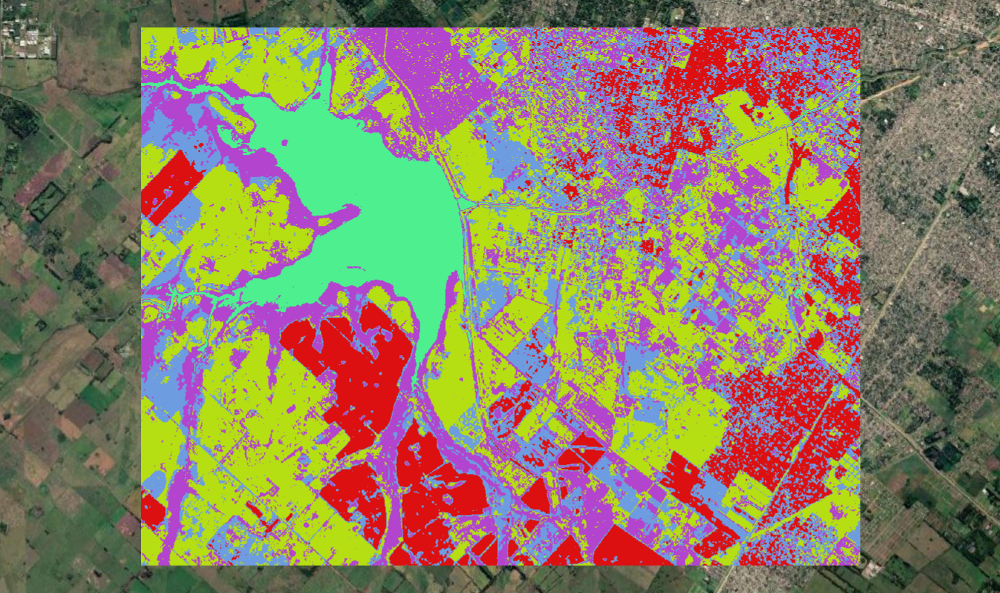

## 3. Entrenamiento de algoritmos - Modelos de mezcla de Gaussianas (GMM)


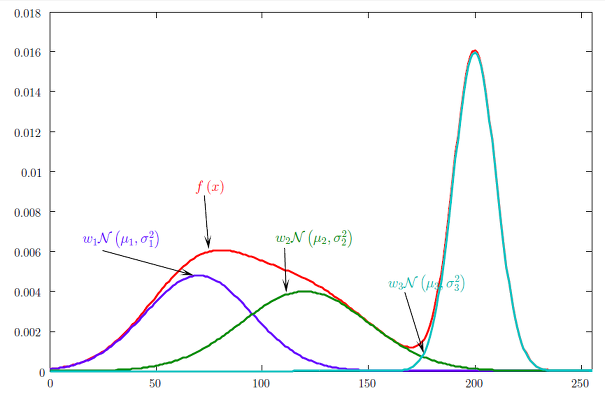

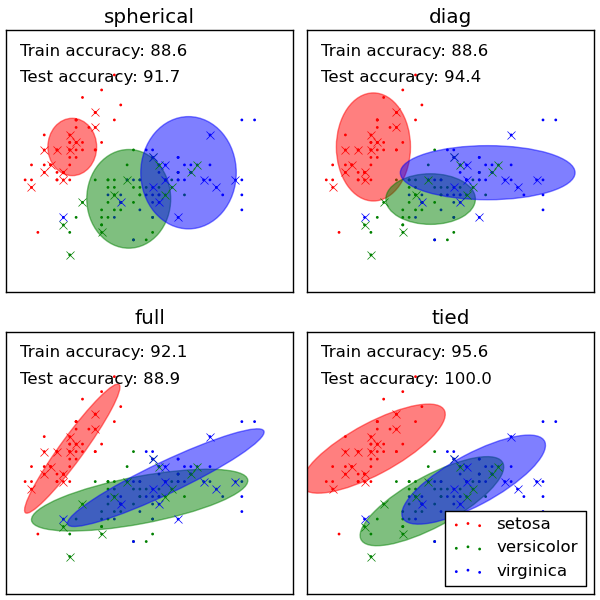

Ahora vamos a ir por [Mezcla de Gaussianas](https://scikit-learn.org/stable/modules/generated/sklearn.mixture.GaussianMixture.html) (o por sus siglas en inglés, _GMM_). Dentro de Scikit-Learn, encontramos a la mezcla de gaussianas dentro del módulo `mixture`. Aquí los parámetros más importantes que debemos definir son:

- El número de componentes, que terminará siendo el número de clusters.
- Qué estructura asumiremos para la matriz de covarianza. El valor por defecto es siempre _full_

```python
# Probamos con 5 componentes:
from sklearn import mixture

gmm = mixture.GaussianMixture(n_components=5, covariance_type='full')
gmm.fit(X)
```

In [23]:
from sklearn import mixture

gmm = mixture.GaussianMixture(n_components=5, covariance_type='full')
gmm.fit(X)

,"n_components n_components: int, default=1The number of mixture components.",5
,"covariance_type covariance_type: {'full', 'tied', 'diag', 'spherical'}, default='full'String describing the type of covariance parameters to use.Must be one of:- 'full': each component has its own general covariance matrix.- 'tied': all components share the same general covariance matrix.- 'diag': each component has its own diagonal covariance matrix.- 'spherical': each component has its own single variance.For an example of using `covariance_type`, refer to:ref:`sphx_glr_auto_examples_mixture_plot_gmm_selection.py`.",'full'
,"tol tol: float, default=1e-3The convergence threshold. EM iterations will stop when thelower bound average gain is below this threshold.",0.001
,"reg_covar reg_covar: float, default=1e-6Non-negative regularization added to the diagonal of covariance.Allows to assure that the covariance matrices are all positive.",1e-06
,"max_iter max_iter: int, default=100The number of EM iterations to perform.",100
,"n_init n_init: int, default=1The number of initializations to perform. The best results are kept.",1
,"init_params init_params: {'kmeans', 'k-means++', 'random', 'random_from_data'}, default='kmeans'The method used to initialize the weights, the means and theprecisions.String must be one of:- 'kmeans' : responsibilities are initialized using kmeans.- 'k-means++' : use the k-means++ method to initialize.- 'random' : responsibilities are initialized randomly.- 'random_from_data' : initial means are randomly selected data points... versionchanged:: v1.1 `init_params` now accepts 'random_from_data' and 'k-means++' as initialization methods.",'kmeans'
,"weights_init weights_init: array-like of shape (n_components, ), default=NoneThe user-provided initial weights.If it is None, weights are initialized using the `init_params` method.",None
,"means_init means_init: array-like of shape (n_components, n_features), default=NoneThe user-provided initial means,If it is None, means are initialized using the `init_params` method.",None
,"precisions_init precisions_init: array-like, default=NoneThe user-provided initial precisions (inverse of the covariancematrices).If it is None, precisions are initialized using the 'init_params'method.The shape depends on 'covariance_type':: (n_components,) if 'spherical', (n_features, n_features) if 'tied', (n_components, n_features) if 'diag', (n_components, n_features, n_features) if 'full'",None
,"random_state random_state: int, RandomState instance or None, default=NoneControls the random seed given to the method chosen to initialize theparameters (see `init_params`).In addition, it controls the generation of random samples from thefitted distribution (see the method `sample`).Pass an int for reproducible output across multiple function calls.See :term:`Glossary <random_state>`.",None


Como GMM no es estrictamente un método de _clustering_ dentro de Scikit-Learn, sí es necesario hacer un paso adicional de predicción de los datos, usando el método `predict()` sobre `X`,  para obtener el resultado de la clasificación. Para pasarlo a imagen, usamos como siempre el _reshape_:

```python
Y_pred_gmm = gmm.predict(X)
Yimg_gmm = Y_pred_gmm.reshape([x, y])
```

In [24]:
Y_pred_gmm = gmm.predict(X)
Yimg_gmm = Y_pred_gmm.reshape([x, y])

Y a continuación lo podemos plotear:

```python
# Ploteamos el resultado
n_componentes = gmm.n_components
cmap = plt.get_cmap('Spectral', n_componentes)

fig, ax = plt.subplots(1,2, figsize=(15, 8), gridspec_kw={'width_ratios': [1.25, 1]})
im = ax[0].imshow(Yimg_gmm, cmap=cmap)
cbar = fig.colorbar(im, ax=ax[0])
cbar.set_ticks(range(n_componentes))
cbar.set_ticklabels(range(n_componentes))
ax[0].set_title("Resultado del clustering")
ax[1].imshow(imagen_escalada[[5,3,2]].transpose(1,2,0))
ax[1].set_title("Imagen RGB")
plt.show()
```

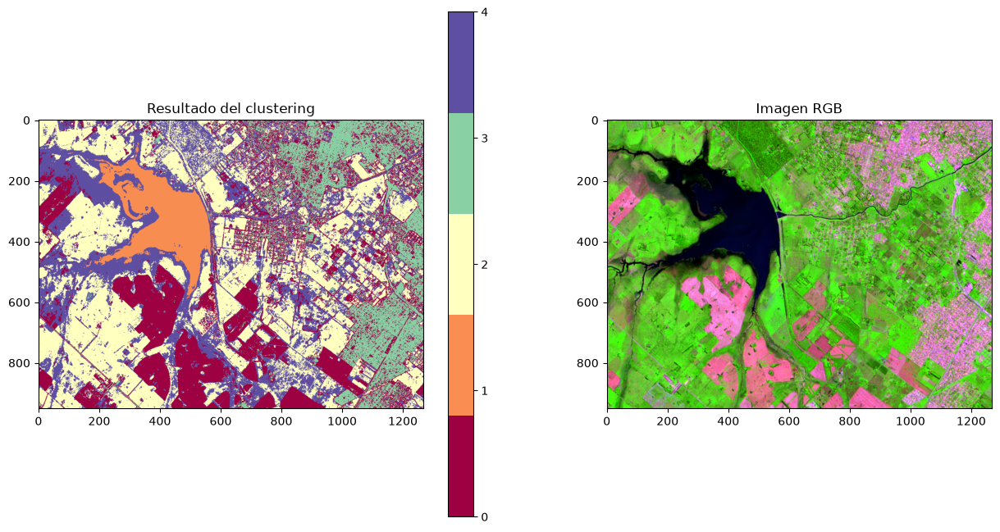

In [25]:
n_componentes = gmm.n_components
cmap = plt.get_cmap('Spectral', n_componentes)

fig, ax = plt.subplots(1,2, figsize=(15, 8), gridspec_kw={'width_ratios': [1.25, 1]})
im = ax[0].imshow(Yimg_gmm, cmap=cmap)
cbar = fig.colorbar(im, ax=ax[0])
cbar.set_ticks(range(n_componentes))
cbar.set_ticklabels(range(n_componentes))
ax[0].set_title("Resultado del clustering")
ax[1].imshow(imagen_escalada[[5,3,2]].transpose(1,2,0))
ax[1].set_title("Imagen RGB")
plt.show()

Y también en este caso, podemos usar ``pairplot` para ver cómo quedan agrupados nuestros píxeles por bandas:

```python
bandas = ['B02', 'B03', 'B04', 'B08', 'B11', 'B12']

df = pd.DataFrame(X[R], columns=bandas)
df['Cluster'] = Y_pred_gmm[R]

sns.pairplot(df, vars=bandas, hue='Cluster')
plt.show()
```

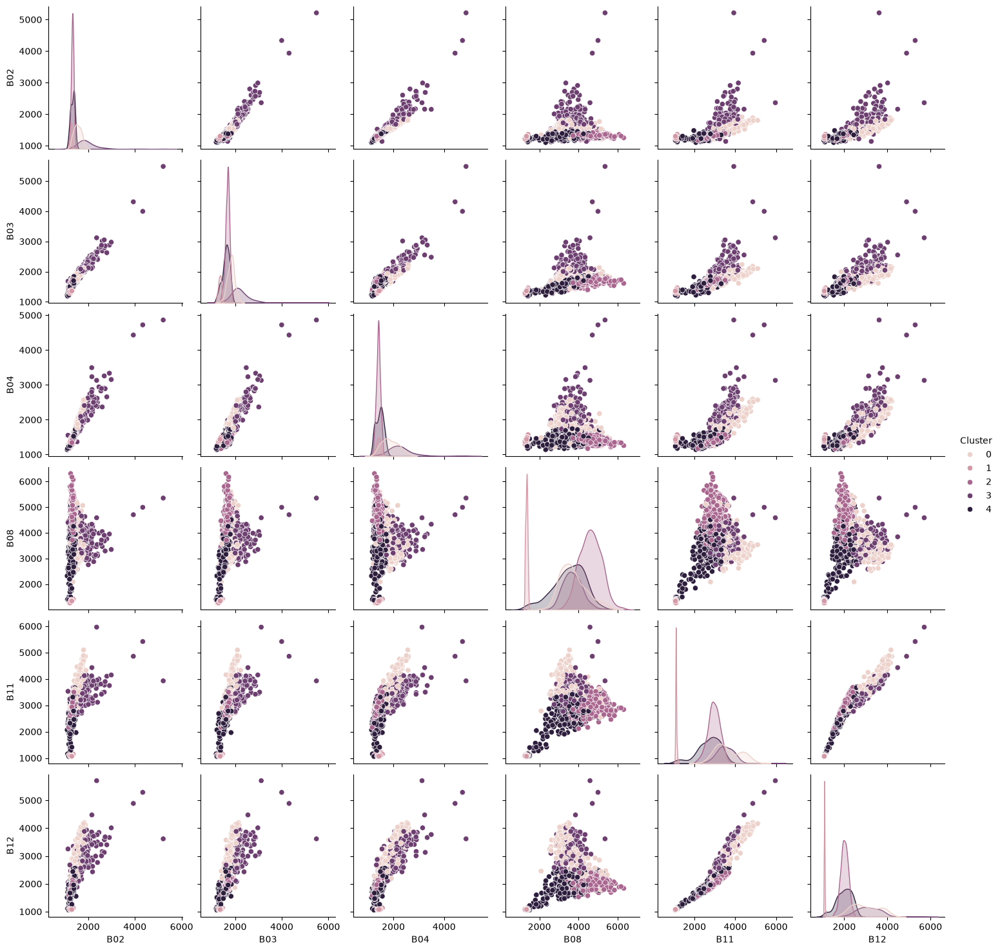

In [26]:
bandas = ['B02', 'B03', 'B04', 'B08', 'B11', 'B12']

df = pd.DataFrame(X[R], columns=bandas)
df['Cluster'] = Y_pred_gmm[R]

sns.pairplot(df, vars=bandas, hue='Cluster')
plt.show()

### 3.1. Guardado del mapa GMM 

Podemos guardar esta clasificación para superponer en QGIS con nuestros otros resultados, y reutilizar la variable ``metadatos_clasif`, que nos sirve para este mapa también:
```python
out_fn = f'Clust_IMG_GMM_{n_componentes}.tif'

with rasterio.open(f'output/{out_fn}', 'w', **metadatos_clasif) as dst:
    dst.write(Yimg, 1)
```

In [27]:
out_fn = f'Clust_IMG_GMM_{n_componentes}.tif'

with rasterio.open(f'output/{out_fn}', 'w', **metadatos_clasif) as dst:
    dst.write(Yimg, 1)

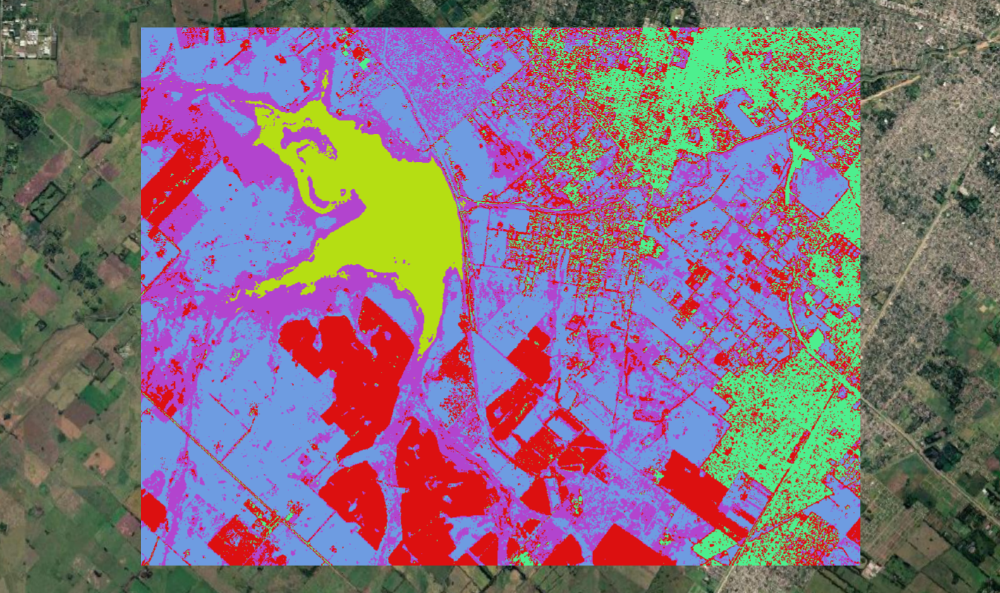

## 4. Patrones espectrales de los clústeres encontrados

Algo útil para relacionar los agrupamientos encontrados con posibles clases temáticas es calcular la reflectividad media para cada _cluster_ por banda espectral, y visualizar dicho patrón. Podemos hacerlo tanto para _K-Means_ como para _GMM_

```python
medias = []

for i in range(n_componentes):
    medias.append(
        X[L==i].mean(axis=0)
    )

medias = np.array(medias)

for i in range(n_componentes):
    plt.plot(bandas, medias[i], label=f'Cluster {i}')

plt.title("Patrones Espestrales de los clusters - KMeans")
plt.legend()
plt.show()
````

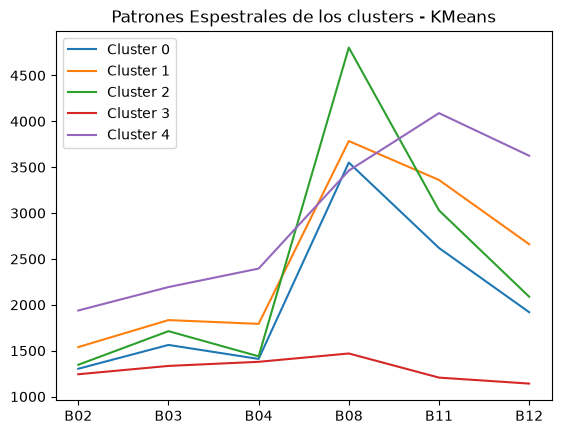

In [28]:
medias = []

for i in range(n_componentes):
    medias.append(
        X[L==i].mean(axis=0)
    )

medias = np.array(medias)

for i in range(n_componentes):
    plt.plot(bandas, medias[i], label=f'Cluster {i}')

plt.title("Patrones Espestrales de los clusters - KMeans")
plt.legend()
plt.show()

Inclusive, podemos visualizar este gráfico de patrones espectrales junto al mapa de _clusters_, para mejor interpretación:

```python
# Calcular las firmas espectrales promedio
medias_KMeans = []

for i in range(n_clases):
    medias_KMeans.append(X[L == i].mean(axis=0))

medias = np.array(medias_KMeans)

# Colormap
cmap = plt.get_cmap('viridis', n_clases)

# Crear figura y ejes
fig, ax = plt.subplots(1, 2,figsize=(18, 8), gridspec_kw={'width_ratios': [2, 1]})

# Mapa de clusters
im = ax[0].imshow(Yimg, cmap=cmap)

ax[0].set_title('Mapa de clusters - KMeans')
ax[0].set_axis_off()

cbar = fig.colorbar(im, ax=ax[0])
cbar.set_ticks(range(n_clases))

# Firmas espectrales

for i in range(n_clases):
    ax[1].plot(bandas, medias_KMeans[i], color=cmap(i), linewidth=2, marker='o', label=f'Cluster {i}')

ax[1].set_title('Patrones espectrales promedio')
ax[1].set_xlabel('Bandas')
ax[1].set_ylabel('Valor digital')
ax[1].grid(True)
ax[1].legend(title='Clusters')

plt.tight_layout()
plt.show()
```

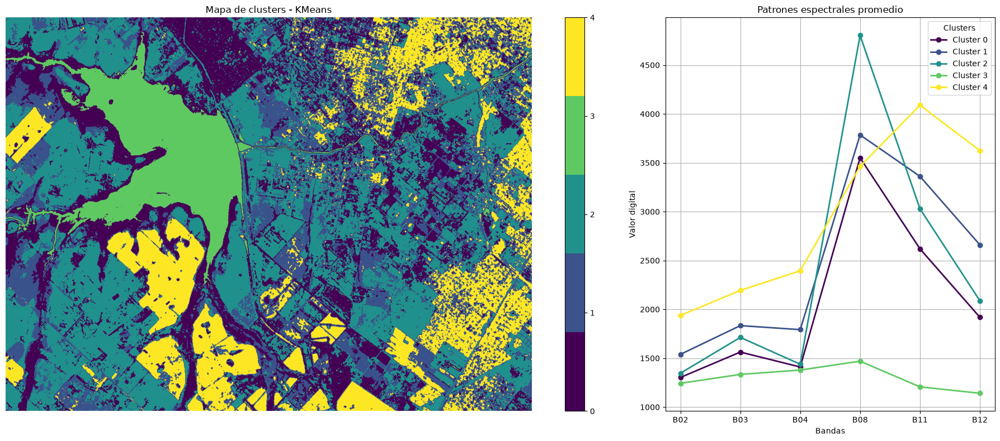

In [29]:
# Calcular las firmas espectrales promedio
medias_KMeans = []

for i in range(n_clases):
    medias_KMeans.append(X[L == i].mean(axis=0))

medias = np.array(medias_KMeans)

# Colormap
cmap = plt.get_cmap('viridis', n_clases)

# Crear figura y ejes
fig, ax = plt.subplots(1, 2,figsize=(18, 8), gridspec_kw={'width_ratios': [2, 1]})

# Mapa de clusters
im = ax[0].imshow(Yimg, cmap=cmap)

ax[0].set_title('Mapa de clusters - KMeans')
ax[0].set_axis_off()

cbar = fig.colorbar(im, ax=ax[0])
cbar.set_ticks(range(n_clases))

# Firmas espectrales

for i in range(n_clases):
    ax[1].plot(bandas, medias_KMeans[i], color=cmap(i), linewidth=2, marker='o', label=f'Cluster {i}')

ax[1].set_title('Patrones espectrales promedio')
ax[1].set_xlabel('Bandas')
ax[1].set_ylabel('Valor digital')
ax[1].grid(True)
ax[1].legend(title='Clusters')

plt.tight_layout()
plt.show()

<h3 style="color:red;">Ejercicio - Entregable!</h3>

En base al análisis espectral, numérico y visual que obtuvimos en esta Notebook, la idea es que ahora pongas en práctica tu interpretación y utilices como base estos mapas para digitalizar polígonos identificando clases temáticas (por ejemplo: "Agua", "Suelo Desnudo", "Cultivo", "Zonas húmedas / humedales", etc). Asegurate de que tenga una columna que se llame `clase`, porque vamos a utilizar dicho campo en la próxima notebook. Si lees tu archivo con Geopandas, debería mostrar más o menos la siguiente estructura:

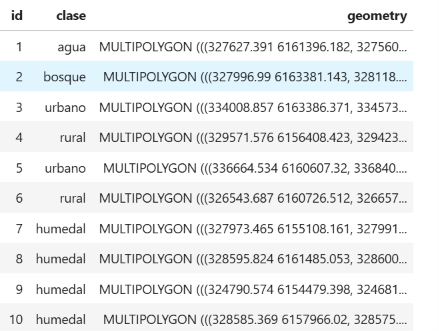

Guardá tu archivo desde QGIS como `muestras_Clase06.gpkg` (o el formato que vos prefieras). En este caso el entregable es solamente este archivo, que está muy ligado a las actividades de la Clase 07.

In [31]:
import geopandas as gpd

In [32]:
clases_path = 'https://github.com/francobarrionuevoenv21/MAIE_devs_pub/raw/refs/heads/main/Proc_Img/practicos/muestras_drog.gpkg'
gdf_clases = gpd.read_file(clases_path)

In [33]:
gdf_clases

,id,clase,geometry
0,1.0,agua,"MULTIPOLYGON (((-58.88273 -34.67582, -58.88276..."
1,2.0,agua,"MULTIPOLYGON (((-58.88775 -34.69571, -58.88772..."
2,3.0,agua,"MULTIPOLYGON (((-58.86504 -34.69719, -58.865 -..."
3,4.0,agua,"MULTIPOLYGON (((-58.82888 -34.68435, -58.82888..."
4,5.0,agua,"MULTIPOLYGON (((-58.78411 -34.66777, -58.7841 ..."
5,6.0,agua,"MULTIPOLYGON (((-58.91231 -34.69817, -58.9123 ..."
6,7.0,agua,"MULTIPOLYGON (((-58.8658 -34.68379, -58.86576 ..."
7,NaN,suel_desn,"MULTIPOLYGON (((-58.87845 -34.70994, -58.87841..."
8,NaN,suel_desn,"MULTIPOLYGON (((-58.91226 -34.6777, -58.91223 ..."
9,NaN,suel_desn,"MULTIPOLYGON (((-58.88029 -34.72793, -58.88025..."


<h3 style="color:red;">Ejercicio - Entregable!</h3>

A partir del análisis de correlación hecho en la sección 1.2, generá un subconjunto de bandas espectrales que consideres que reduce la redundancia de datos, y guarda un GeoTiff con esas bandas como `output/S2_20181006_{bandas}_Clase06.tif`., donde `{bandas}` es el listado descriptivo de bandas que elegiste para armar este subconjunto. Acá abajo se deja un código de ejemplo donde se eligen dos bandas y se genera un nuevo `array` a partir de una lista `bandas_seleccionadas`. Se configura también un nombre de salida adaptado a esas bandas. Luego vos tenés que completar los otros pasos para guardar el archivo, actualizando los metadatos si es necesario.

```python
bandas_seleccionadas = ['B04', 'B08']

# Buscar la posición de cada banda dentro de la lista de bandas original
indices = [
    bandas.index(banda)
    for banda in bandas_seleccionadas
]

# Crear un subconjunto del array original
img_subset = img[indices]

print(f'Dimensiones de la imagen original: {img.shape}')
print(f'Dimensiones del subconjunto: {img_subset.shape}')

# Guardar el subconjunto de bandas como un nuevo GeoTIFF, poniéndole un nombre con referencia a las bandas seleccionadas

# Esta línea "concatena" los textos de la lista separados por un "_"
nombre_bandas = "_".join(bandas_seleccionadas)

# Esta línea arma un nombre de archivo de salida con las bandas elegidas
nombre_archivo = f'output/S2_20181006_{nombre_bandas}.tif'

print(nombre_archivo)

### Qué sigue luego: Guardar el archivo final usando nombre_archivo como nombre

```

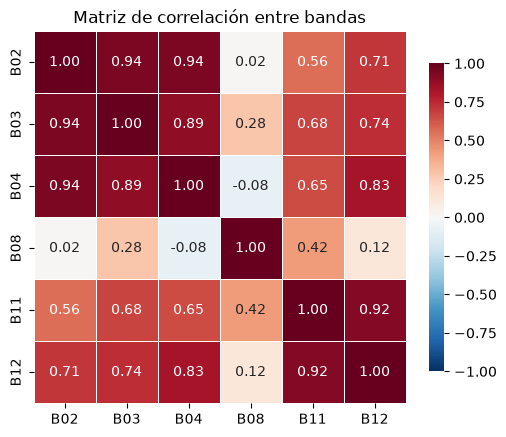

In [43]:
raster_fn = 'output/S2_20181006.tif'

with rasterio.open(raster_fn) as src:
    img = src.read()
    metadatos = src.meta

In [50]:
bandas_org = ['B02', 'B03', 'B04', 'B08', 'B11', 'B12']
bandas_seleccionadas = ['B02', 'B03', 'B08', 'B11']

# Buscar la posición de cada banda dentro de la lista de bandas original
indices = [
    bandas_org.index(banda)
    for banda in bandas_seleccionadas
]

# Crear un subconjunto del array original
img_subset = img[indices]

print(f'Dimensiones de la imagen original: {img.shape}')
print(f'Dimensiones del subconjunto: {img_subset.shape}')

# Guardar el subconjunto de bandas como un nuevo GeoTIFF, poniéndole un nombre con referencia a las bandas seleccionadas

# Esta línea "concatena" los textos de la lista separados por un "_"
nombre_bandas = "_".join(bandas_seleccionadas)

# Esta línea arma un nombre de archivo de salida con las bandas elegidas
nombre_archivo = f'output/S2_20181006_{nombre_bandas}.tif'

print(nombre_archivo)

### Qué sigue luego: Guardar el archivo final usando nombre_archivo como nombre

Dimensiones de la imagen original: (6, 951, 1269)
Dimensiones del subconjunto: (4, 951, 1269)
output/S2_20181006_B02_B03_B08_B11.tif


In [52]:
# Actualización de metadatos para guardar la máscara como imagen .tif

## Cantidad de bandas de la imagen
bandas = len(bandas_seleccionadas)
dict_meta = metadatos

# Actualización del transform según el recorte
transform_updt = src.transform #rasterio.windows.transform(ventana_recorte, spot_multibanda.transform)

# Creación diccionario de metadatos
recorte_metadatos = {'driver': dict_meta['driver'],
                  'dtype': dict_meta['dtype'],
                  'nodata': dict_meta['nodata'],
                  'width': dict_meta['width'],
                  'height': dict_meta['height'],
                  'count': bandas,
                  'crs': dict_meta['crs'],
                  'transform': transform_updt}

In [53]:
with rasterio.open(nombre_archivo, "w", **recorte_metadatos) as dst:
    dst.write(img_subset)

    # Recorro la lista y voy poniéndole la descripción a cada banda
    for i, nombre in enumerate(bandas_seleccionadas):
        dst.set_band_description(i+1, nombre)